# Kinematics - Constraint Solving

## Three bar mechanism

![Three bar CAD_sketchs](graphics/ThreeBars.png){width=80% align="center"}

Given an input angle $\theta \in [0,360^\circ]$ measured from the vertical arund point $C$, going counter-clockwise, we want to find the positions of points $A$ and $B$ and thus determine the state of the mechanism.

The kinematic analysis is easy enough for a textbook example where the mechanism is set up such that the positions are trivial. In general, a mechanism is coupled and one needs to involve unknown variables and solve a system of equations, one for every body to determine the kinematics. There is no guarantee that the solution is unique in general so conditions need to be applied on these variables, i.e., they need to be defined such that a certain kinematic solution is aquired.

### Preliminary kinematic analysis

Before diving into the mathematics of kinematics, it is recommended to create the system in e.g., CAD or LEGOs, to get familiar with the kinematics and get an intuition for it.

![Quick Fusion 360 sketch over the situation](graphics/CAD_Sketch.png){width=80% align="center"}

::: {layout-ncol=2}
![Definition of a valid topology. For each tiny change in $\theta$ we get a valid topology](graphics/valid_topology.png){}

![Definition of an invalid topology. Note that the angle is the same, but we get a "wrong" solution](graphics/invalid_topology.png){}
:::

![In this configuration the CB arm can no longer be rotated clockwise](graphics/lower_limit.png){align="center"}

![In this configuration the CB arm can no longer be rotated counter-clockwise](graphics/upper_limit.png){align="center"}

We have discovered the limits of the angle $\theta \in [\theta_{min},\theta_{max}]$ for which the mechanism is valid. Outside these limits, the mechanism locks up and can no longer be rotated.

### Kinematic analysis

![Sketch of three bar linkage](graphics/Three_bar_sketch.png){width=80% align="center"}

Note that the unknown position can be solved for by defining the point $B$ from both the point $O$ and well as from the point $C$ using vector addition, we "walk" from $O$ to $B$ via $A$.

The direction towards $A$ is given by defining $\boldsymbol r_{OA}$ using a direction given by an angle $\varphi$ defined as the angle between the $y-$axis and the line $OA$. 

We get the $\boldsymbol r_{AB}$ direction, similarly, by defining the angle, $\gamma$ between the $y-$axis and the line $AB$ $OB$. 

Additionally we can "walk" to the point $B$ from $C$. This way we have two ways of getting to OB, thus a system of equations is established from which we can solve for the two unknowns, $\varphi$ and $\gamma$.

### Equations of constraint

We have the following kinematics

$$
\boldsymbol{r}_{O B}=\boldsymbol{r}_{OC}+\boldsymbol{r}_{C B}=\boldsymbol{r}_{O A}+\boldsymbol{r}_{A B}
$$

or

$$
\boxed{\boldsymbol{r}_{OC}+\boldsymbol{r}_{C B}(\theta)=\boldsymbol{r}_{O A}(\varphi)+\boldsymbol{r}_{A B}(\gamma)}
$$


For a valid $\theta$ we get two equations, where we can solve for the two unknown variables $\varphi(\theta)$ and $\gamma(\theta)$.

$$
\boldsymbol{r}_{OA}(\varphi)=r_{OA}\begin{bmatrix}\sin\varphi\\
\cos\varphi
\end{bmatrix},\ \boldsymbol{r}_{AB}(\gamma)=r_{AB}\begin{bmatrix}\sin\gamma\\
\cos\gamma
\end{bmatrix},\ \boldsymbol{r}_{CB}(\theta)=r_{CB}\begin{bmatrix}-\sin\varphi\\
\cos\varphi
\end{bmatrix}
$$

### Numerical solution

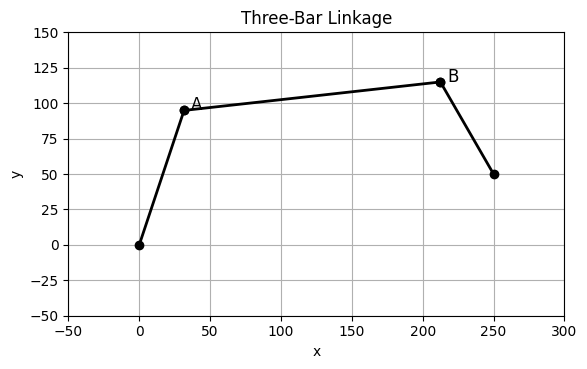

In [20]:
# | code-fold: false
import numpy as np
import matplotlib.pyplot as plt
import scipy

r_OA = 100.0  # Length of link OA
r_CB = 75.0   # Length of link CB
rr_OC = np.array([250, 50])  
r_AB = np.sqrt((250 - 75)**2 + (100 - 50)**2)

theta = np.deg2rad(30)  # Angle of link OC in radians

def equations(vars, theta):
    """
    Args:
        vars: A list or tuple [phi, gamma] containing the angles
              of links OA and AB in radians.
    Returns:
        The distance between points B from A and B from C, this distance is zero for the correct set of phi and gamma.
    """
    phi, gamma = vars

    rr_OA = r_OA * np.array([np.sin(phi), np.cos(phi)]) 
    rr_AB = r_AB * np.array([np.sin(gamma), np.cos(gamma)])
    # Position of B calculated from chain O->A->B
    rr_OAB = rr_OA + rr_AB

    # Position of B calculated from chain C->B
    # [-sind(θ), cosd(θ)] which corresponds to an angle measured from the +y axis
    rr_CB = r_CB * np.array([-np.sin(theta), np.cos(theta)])
    rr_OCB = rr_OC + rr_CB

    return rr_OAB - rr_OCB

def plot_mechanism(rr_OA, rr_OB, rr_OC):
    # Plot the links of the mechanism
    ax.plot(*zip([0,0], rr_OA), '-ko',lw=2)
    ax.plot(*zip(rr_OC, rr_OB), '-ko',lw=2)
    ax.plot(*zip(rr_OA, rr_OB), '-ko',lw=2)

    ax.text(rr_OA[0] + 5, rr_OA[1], 'A', fontsize=12)
    ax.text(rr_OB[0] + 5, rr_OB[1], 'B', fontsize=12)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title('Three-Bar Linkage')
    ax.grid(True)
    ax.set_aspect('equal', adjustable='box') # Ensures correct proportions
    ax.set_xlim(-50, 300)
    ax.set_ylim(-50, 150)

initial_guess = np.deg2rad([50, 70]) 
solution_rad = scipy.optimize.fsolve(equations, initial_guess, args=(theta,))
phi_sol, gamma_sol = solution_rad

rr_OA = r_OA * np.array([np.sin(phi_sol), np.cos(phi_sol)])

rr_OB = rr_OA + r_AB * np.array([np.sin(gamma_sol), np.cos(gamma_sol)])

fig, ax = plt.subplots()
plot_mechanism(rr_OA, rr_OB, rr_OC)

In [21]:
# | code-fold: true
import numpy as np
import matplotlib.pyplot as plt
import scipy
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 60  # Increase if needed
from matplotlib.colors import to_rgba

r_OA = 100.0  # Length of link OA
r_CB = 75.0   # Length of link CB
rr_OC = np.array([250, 50])  
r_AB = np.sqrt((250 - 75)**2 + (100 - 50)**2)

def equations(vars, theta):
    """
    Args:
        vars: A list or tuple [phi, gamma] containing the angles
              of links OA and AB in radians.
    Returns:
        The distance between points B from A and B from C, this distance is zero for the correct set of phi and gamma.
    """
    phi, gamma = vars

    rr_OA = r_OA * np.array([np.sin(phi), np.cos(phi)]) 
    rr_AB = r_AB * np.array([np.sin(gamma), np.cos(gamma)])
    # Position of B calculated from chain O->A->B
    rr_OAB = rr_OA + rr_AB

    # Position of B calculated from chain C->B
    # [-sind(θ), cosd(θ)] which corresponds to an angle measured from the +y axis
    rr_CB = r_CB * np.array([-np.sin(theta), np.cos(theta)])
    rr_OCB = rr_OC + rr_CB

    return rr_OAB - rr_OCB

def is_valid_solution(theta, initial_guess, tolerance=1e-3):
    """Check if theta has a valid kinematic solution"""
    try:
        solution, info, ier, msg = scipy.optimize.fsolve(
            equations, initial_guess, args=(theta,), full_output=True
        )
        # Check if solver converged and residual is small
        residual = np.linalg.norm(info['fvec'])
        return ier == 1 and residual < tolerance, solution
    except:
        return False, None

# Find valid theta range by scanning
print("Finding valid theta range...")
theta_test = np.linspace(np.deg2rad(-30), np.deg2rad(300), 30+300)
thetas = []
initial_guess = np.deg2rad([50, 70])

for theta in theta_test:
    is_valid, sol = is_valid_solution(theta, initial_guess)
    if is_valid:
        thetas.append(theta)
        initial_guess = sol  # Use previous solution as next guess
        # print(f"Valid theta found: {np.rad2deg(theta):.1f}°")

if len(thetas) > 0:
    theta_min = thetas[0]
    theta_max = thetas[-1]
    print(f"Valid theta range: [{np.rad2deg(theta_min):.1f}°, {np.rad2deg(theta_max):.1f}°]")
    print(f"Number of valid configurations: {len(thetas)}")
else:
    print("No valid solutions found!")
    theta_min, theta_max = 0, 0

def plot_mechanism(rr_OA, rr_OB, rr_OC, theta):
    # Plot the links of the mechanism
    ax.plot(*zip([0,0], rr_OA), '-ko',lw=2)
    ax.plot(*zip(rr_OC, rr_OB), '-ko',lw=2)
    ax.plot(*zip(rr_OA, rr_OB), '-ko',lw=2)

    ax.text(rr_OA[0] + 5, rr_OA[1], 'A', fontsize=12)
    ax.text(rr_OB[0] + 5, rr_OB[1], 'B', fontsize=12)
    ax.text(rr_OC[0] + 5, rr_OC[1], 'C', fontsize=12)
    ax.text(5, 5, 'O', fontsize=12)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'Three-Bar Linkage (θ = {np.rad2deg(theta):.1f}°)')
    ax.grid(True)
    ax.set_aspect('equal', adjustable='box') # Ensures correct proportions
    ax.set_xlim(-50, 300)
    ax.set_ylim(-50, 150)

# Only animate valid theta values
# thetas = np.linspace(theta_min, theta_max, 60)

fig, ax = plt.subplots(figsize=(10, 8))

def animate(frame_idx):
    """Animation function for each frame"""
    ax.clear()
    
    theta = thetas[frame_idx]
    initial_guess = np.deg2rad([50, 70]) 
    solution_rad = scipy.optimize.fsolve(equations, initial_guess, args=(theta,))
    phi_sol, gamma_sol = solution_rad

    rr_OA = r_OA * np.array([np.sin(phi_sol), np.cos(phi_sol)])
    rr_OB = rr_OA + r_AB * np.array([np.sin(gamma_sol), np.cos(gamma_sol)])

    plot_mechanism(rr_OA, rr_OB, rr_OC, theta)

# Create figure and axis (close to prevent static display)
plt.close(fig)  # Prevent static image from showing

# Create animation
anim = FuncAnimation(fig, animate, frames=len(thetas), 
                     interval=100, repeat=True)

# Get the HTML and wrap it with responsive CSS
anim_html = anim.to_jshtml()

# Wrap with CSS to make it responsive and fit to 100% width
responsive_html = f"""
<div style="width: 100%; max-width: 100%; overflow: hidden;">
    <style>
        .animation-container {{
            width: 100% !important;
            max-width: 100% !important;
        }}
        .animation-container img {{
            width: 100% !important;
            height: auto !important;
        }}
    </style>
    <div class="animation-container">
        {anim_html}
    </div>
</div>
"""
HTML(responsive_html)

# video_html = anim.to_html5_video()
# video_html = video_html.replace('controls', 'controls autoplay loop muted')
# video_html = video_html.replace(
#     '<video ', 
#     '<video style="width: 100%; height: auto;" '
# )
# HTML(video_html)

Finding valid theta range...
Valid theta range: [-1.9°, 204.7°]
Number of valid configurations: 207


## Kinematic constraints

We have seen in the three bar mechanism example that we can set up equations of constraint based on the geometry of the mechanism. We explicitly defined the position vectors of the joints in the mechanism and set up equations based on these. Formulating these equations means introducing unknown variables, which we then solve for, these are the degrees of freedom for the given joint.

In general all joints can be set up in a similar manner, by defining equations using position vectors of the joints. The number of equations of constraint will depend on the type of joint used, e.g., a [revolute joint](https://en.wikipedia.org/wiki/Revolute_joint) will have two equations of constraint (in 2D) since the two bodies can only rotate relative to each other, while a [prismatic joint](https://en.wikipedia.org/wiki/Prismatic_joint) will have one equation of constraint since the two bodies can only translate relative to each other.

Every variable introduced in the equations of constraint will be a degree of freedom for the mechanism. The number of degrees of freedom will determine how many independent inputs are needed to fully define the state of the mechanism.

## The Crank-Slider mechanism

![The crank-slider mechanism translate linear motion to rotational motion.](graphics/Crank-Slider.png){width=80% align="center"}

Study the motion of the slider-crank mechanism. Plot the motion of $A$ and $B$ as a function of $\theta$.

**Solution**:

We need to determine the position of point $A$ as a function of the input angle $\theta$. 

Let $r$ denote the length of the crank $OA$ and $L$ the length of the connecting rod $AB$. The horizontal component of $\overrightarrow{OB}$ is given by $a=r\cos\theta$ and vertical component is given by $h=r\sin\theta$. Using the Pythagorean theorem we get the horizontal component of $\overrightarrow{AB}$ as $b=\sqrt{L^2-h^2}$. Thus the position of point $A$ is given by 

$$
\boldsymbol{r}_A = \begin{bmatrix} -(a+b) \\ 0 \end{bmatrix}
$$

$$
\boldsymbol{r}_B  = r \begin{bmatrix} -\cos \theta \\ \sin \theta  \end{bmatrix}
$$

In [14]:
#| echo: false
import numpy as np
import sympy as sp
import matplotlib.pyplot as plt
import mechanicskit as mk

In [ ]:
#| code-fold: false
theta = sp.symbols('theta', real=True)
r, L = sp.symbols('r L', positive=True, real=True)

h = r * sp.sin(theta)
a = r * sp.cos(theta)
b = sp.sqrt(L**2 - h**2)

rr_OA = sp.Matrix([-(a + b), 0])

In [ ]:
#| echo: false
mk.display_labeled_latex(r'\boldsymbol{r}_{OA}=', rr_OA)

<IPython.core.display.Latex object>

### Solving using constraint

The previous solution used geometric reasoning to directly compute the positions. We now reformulate the problem using constraint equations, which is more general and scalable to complex mechanisms.

#### Constraint Formulation

The crank-slider mechanism consists of:

- **Crank OB**: Revolute joint at O, rotates with angle $\theta$ (input)
- **Connecting rod BA**: Connects point B to slider at A
- **Slider at A**: Prismatic joint, constrained to move along the horizontal axis

We introduce the following variables:

- $\theta$: Crank angle (input, known)
- $\varphi$: Angle of connecting rod BA measured from the positive $x$-axis
- $x_A$: Horizontal position of slider A (unknown)

The position vectors are defined as:

$$
\boldsymbol{r}_{OB} = r\begin{bmatrix}-\cos\theta \\ \sin\theta\end{bmatrix}, \quad \boldsymbol{r}_{BA} = L\begin{bmatrix}\cos\varphi \\ \sin\varphi\end{bmatrix}, \quad \boldsymbol{r}_{OA} = \begin{bmatrix}x_A \\ 0\end{bmatrix}
$$

The constraint equation is obtained by requiring that the connecting rod connects B to A:

$$
\boldsymbol{r}_{OA} = \boldsymbol{r}_{OB} + \boldsymbol{r}_{BA}
$$

Substituting the position vectors:

:::important
$$
\begin{bmatrix}x_A \\ 0\end{bmatrix} = r\begin{bmatrix}-\cos\theta \\ \sin\theta\end{bmatrix} + L\begin{bmatrix}\cos\varphi \\ \sin\varphi\end{bmatrix}
$$

It is this system of equations that we need to solve for the unknowns $\varphi$ and $x_A$ given the input $\theta$. This is done numerically in the code below. 
:::

To continue this analysis, this yields two scalar equations:

$$
\begin{align}
x_A &= -r\cos\theta + L\cos\varphi \tag{1}\\
0 &= r\sin\theta + L\sin\varphi \tag{2}
\end{align}
$$

Equation (2) is the **constraint equation** that enforces the slider to remain on the horizontal axis. From this we can solve for $\varphi$:

$$
\boxed{\sin\varphi = -\frac{r}{L}\sin\theta}
$$

This requires $|r\sin\theta| \leq L$, which is always satisfied for $r < L$ (typical crank-slider design).

Once $\varphi$ is determined, the slider position follows from equation (1):

$$
\boxed{x_A = -r\cos\theta + L\cos\varphi}
$$

where

$$
\cos\varphi = \pm\sqrt{1 - \left(\frac{r}{L}\sin\theta\right)^2}
$$

The sign of $\cos\varphi$ determines the configuration. For the typical crank-slider mechanism, we choose the positive sign when the connecting rod points in the negative $x$-direction.

#### Degrees of Freedom

This mechanism has:

- **Input**: $\theta$ (1 DOF)
- **Unknowns**: $\varphi$ and $x_A$ (2 unknowns)
- **Constraint equations**: 1 constraint (equation 2)

Thus, the mechanism has **1 degree of freedom**, as expected: specifying $\theta$ uniquely determines the configuration.

### Numerical Solution using Constraints

For θ = 45.0°:
  φ = 193.63°
  x_A = -181.13 mm
  |BA| = 150.00 mm (should be 150.00 mm)
  Residual: 6.70e-14


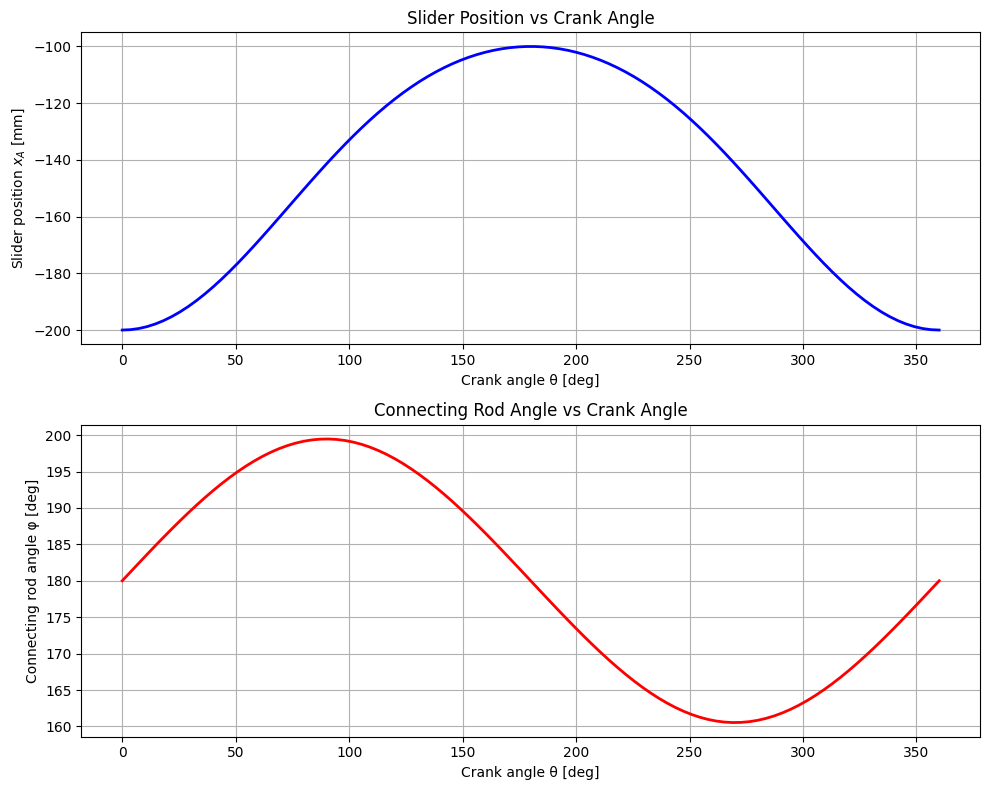

In [20]:
# | code-fold: show
import numpy as np
import matplotlib.pyplot as plt
import scipy.optimize

import warnings
warnings.filterwarnings('ignore', message='The iteration is not making good progress')

# Mechanism parameters (same as geometric solution)
r = 50.0   # Crank length
L = 150.0  # Connecting rod length

def constraint_equations(vars, theta):
    """
    Constraint equations for crank-slider mechanism.
    
    Args:
        vars: [phi, x_A] - angle of connecting rod and slider position
        theta: crank angle (input)
        
    Returns:
        residuals: [eq1, eq2] - constraint equation residuals
    """
    phi, x_A = vars
    
    # Position of B (end of crank)
    rr_OB = r * np.array([-np.cos(theta), np.sin(theta)])
    
    # Position of A from B using connecting rod
    rr_BA = L * np.array([np.cos(phi), np.sin(phi)])
    
    # Position of A (computed from chain O->B->A)
    rr_OA_computed = rr_OB + rr_BA
    
    # Position of A (constrained to horizontal axis)
    rr_OA_constraint = np.array([x_A, 0])
    
    # Residuals (should be zero when constraints are satisfied)
    residuals = rr_OA_computed - rr_OA_constraint
    
    return residuals

# Solve for one configuration
theta_test = np.deg2rad(45)  # Test angle
initial_guess = [np.deg2rad(180), -150]  # Initial guess for [phi, x_A]

solution = scipy.optimize.fsolve(constraint_equations, initial_guess, args=(theta_test,))
phi_sol, x_A_sol = solution

print(f"For θ = {np.rad2deg(theta_test):.1f}°:")
print(f"  φ = {np.rad2deg(phi_sol):.2f}°")
print(f"  x_A = {x_A_sol:.2f} mm")

# Verify the solution
rr_OB = r * np.array([-np.cos(theta_test), np.sin(theta_test)])
rr_OA = np.array([x_A_sol, 0])
rr_BA = rr_OA - rr_OB
print(f"  |BA| = {np.linalg.norm(rr_BA):.2f} mm (should be {L:.2f} mm)")
print(f"  Residual: {np.linalg.norm(constraint_equations(solution, theta_test)):.2e}")

# Solve for full rotation
theta_range = np.linspace(0, 2*np.pi, 100)
phi_solutions = []
x_A_solutions = []

initial_guess = [np.deg2rad(180), -150]  # Start from a reasonable configuration

for theta in theta_range:
    try:
        sol = scipy.optimize.fsolve(constraint_equations, initial_guess, args=(theta,))
        phi_sol, x_A_sol = sol
        
        # Verify solution quality
        residual = np.linalg.norm(constraint_equations(sol, theta))
        if residual < 1e-6:  # Good solution
            phi_solutions.append(phi_sol)
            x_A_solutions.append(x_A_sol)
            initial_guess = sol  # Use previous solution as initial guess
        else:
            phi_solutions.append(np.nan)
            x_A_solutions.append(np.nan)
    except:
        phi_solutions.append(np.nan)
        x_A_solutions.append(np.nan)

phi_solutions = np.array(phi_solutions)
x_A_solutions = np.array(x_A_solutions)

# Plot results
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# Plot slider position
axes[0].plot(np.rad2deg(theta_range), x_A_solutions, 'b-', linewidth=2)
axes[0].set_xlabel('Crank angle θ [deg]')
axes[0].set_ylabel('Slider position $x_A$ [mm]')
axes[0].set_title('Slider Position vs Crank Angle')
axes[0].grid(True)

# Plot connecting rod angle
axes[1].plot(np.rad2deg(theta_range), np.rad2deg(phi_solutions), 'r-', linewidth=2)
axes[1].set_xlabel('Crank angle θ [deg]')
axes[1].set_ylabel('Connecting rod angle φ [deg]')
axes[1].set_title('Connecting Rod Angle vs Crank Angle')
axes[1].grid(True)

plt.tight_layout()
plt.show()

In [18]:
# | code-fold: true
# Animation of crank-slider mechanism using constraint-based solution
import warnings
warnings.filterwarnings('ignore', message='The iteration is not making good progress')

from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 60

r = 50.0   # Crank length
L = 150.0  # Connecting rod length

def constraint_equations(vars, theta):
    """Constraint equations for crank-slider mechanism."""
    phi, x_A = vars
    rr_OB = r * np.array([-np.cos(theta), np.sin(theta)])
    rr_BA = L * np.array([np.cos(phi), np.sin(phi)])
    rr_OA_computed = rr_OB + rr_BA
    rr_OA_constraint = np.array([x_A, 0])
    return rr_OA_computed - rr_OA_constraint

# Prepare animation data
theta_range = np.linspace(0, 2*np.pi, 60)
solutions = []
initial_guess = [np.deg2rad(180), -150]

for theta in theta_range:
    sol = scipy.optimize.fsolve(constraint_equations, initial_guess, args=(theta,))
    solutions.append((theta, sol[0], sol[1]))  # (theta, phi, x_A)
    initial_guess = sol

fig, ax = plt.subplots(figsize=(12, 6))

def plot_mechanism(theta, phi, x_A):
    """Plot the crank-slider mechanism for given configuration."""
    ax.clear()
    
    # Calculate positions
    O = np.array([0, 0])
    B = r * np.array([-np.cos(theta), np.sin(theta)])
    A = np.array([x_A, 0])
    
    # Plot ground
    ground_x = np.linspace(-250, 50, 100)
    ax.plot(ground_x, np.zeros_like(ground_x), 'k-', linewidth=3, alpha=0.3)
    
    # Plot slider rail
    ax.plot([-250, 50], [0, 0], 'k-', linewidth=5)
    
    # Plot crank OB
    ax.plot([O[0], B[0]], [O[1], B[1]], 'b-o', linewidth=3, markersize=8, label='Crank')
    
    # Plot connecting rod BA
    ax.plot([B[0], A[0]], [B[1], A[1]], 'r-o', linewidth=3, markersize=8, label='Connecting rod')
    
    # Plot slider
    slider_width = 20
    slider_height = 15
    slider_rect = plt.Rectangle((x_A - slider_width/2, -slider_height/2), 
                                slider_width, slider_height, 
                                facecolor='green', edgecolor='black', linewidth=2)
    ax.add_patch(slider_rect)
    
    # Plot origin
    ax.plot(O[0], O[1], 'ko', markersize=10, label='O (origin)')
    
    # Labels
    ax.text(B[0] + 5, B[1] + 5, 'B', fontsize=12, fontweight='bold')
    ax.text(A[0], A[1] + 10, 'A', fontsize=12, fontweight='bold')
    ax.text(O[0] - 10, O[1] + 10, 'O', fontsize=12, fontweight='bold')
    
    # Settings
    ax.set_xlim(-220, 60)
    ax.set_ylim(-80, 80)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.3)
    ax.set_xlabel('x [mm]')
    ax.set_ylabel('y [mm]')
    ax.set_title(f'Crank-Slider Mechanism (θ = {np.rad2deg(theta):.1f}°, φ = {np.rad2deg(phi):.1f}°)')
    ax.legend(loc='upper right')

def animate(frame_idx):
    """Animation function."""
    theta, phi, x_A = solutions[frame_idx]
    plot_mechanism(theta, phi, x_A)

# Create animation
plt.close(fig)
anim = FuncAnimation(fig, animate, frames=len(solutions), 
                     interval=50, repeat=True)

# Convert to HTML5 video
video_html = anim.to_html5_video()
video_html = video_html.replace('controls', 'controls autoplay loop muted')
video_html = video_html.replace('<video ', '<video style="width: 100%; height: auto;" ')
HTML(video_html)